## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
#%matplotlib qt
from matplotlib import gridspec

# a utility function for plotting opencv images with matplotlib 
def mp(img):
    return cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    

In [2]:


# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)
        #plt.figure()
        #plt.imshow(img, cmap='gray')
        #plt.show()

print("Calibrating camera")
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print("Calibrated camera")

    



Calibrating camera
Calibrated camera


I will try this calibration on the test images

['../test_images/straight_lines1.jpg', '../test_images/straight_lines2.jpg', '../test_images/test1.jpg', '../test_images/test2.jpg', '../test_images/test3.jpg', '../test_images/test4.jpg', '../test_images/test5.jpg', '../test_images/test6.jpg']


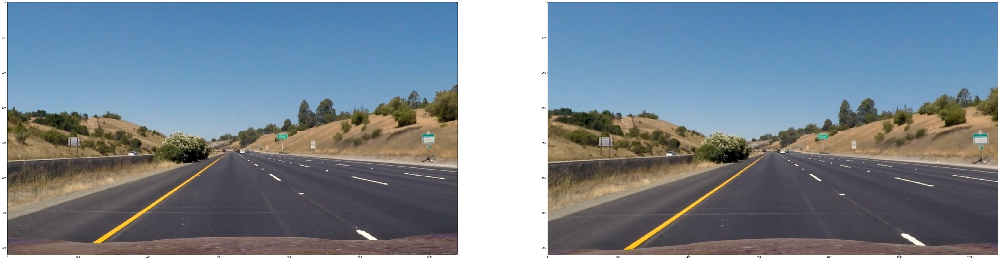

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [3]:

test_images = glob.glob('../test_images/*.jpg')
print(test_images)

for fname in test_images:
    img = cv2.imread(fname)
    #gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    dst = cv2.undistort((img), mtx, dist, None, mtx)
    
    
    fig = plt.figure(figsize=(80, 30)) 
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1]) 
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax0.imshow(mp(img))
    
    ax1.imshow(mp(dst))
    plt.show()
#    size_ = (80, 30)
#    plt.figure(figsize=size_)
#    plt.imshow(mp(img))
#    plt.show()
#    plt.figure(figsize=size_)
#    plt.imshow(mp(dst))
#    plt.show()
    
    #break


The next step is to transform the image, so that we will have a similar perspective to a birds eye view.

In [ ]:
def correct_perspective(img, M, img_size):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    warped = cv2.warpPerspective(undistorted, M, img_size, flags=cv2.INTER_LINEAR)
    return warped


def set_up_perspective_transform():
    gray = cv2.cvtColor(cv2.imread(test_images[0]),cv2.COLOR_BGR2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    #print (img_size)
    #src=np.float32([(450,450),(1000,450),(2000,700),(200,700)])
    #dst=np.float32([(0,0),(1200,0),(1200,700),(00,700)])
    offset = 10
    dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                         [img_size[0]-offset, img_size[1]-offset], 
                                         [offset, img_size[1]-offset]])
    #src=np.float32([(590,440),(700,440),(1300,640),(90,640)])
    y_min = 445
    y_max = 640
    src=np.float32([(575,y_min),(713,y_min),(1300,y_max),(90,y_max)])
    M = cv2.getPerspectiveTransform(src, dst)
    return M,img_size




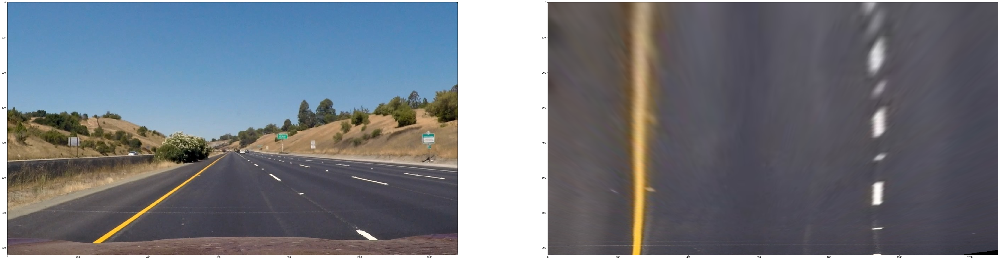

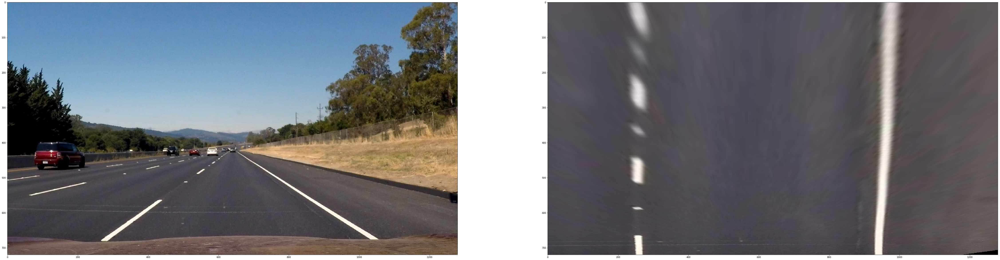

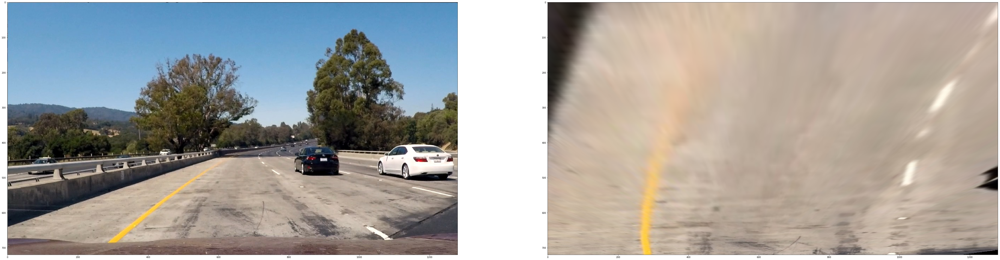

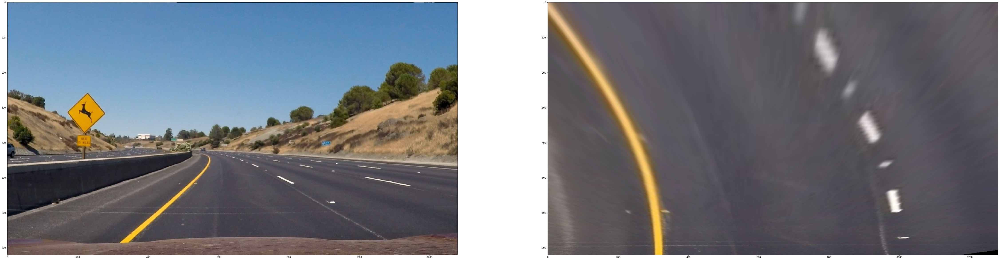

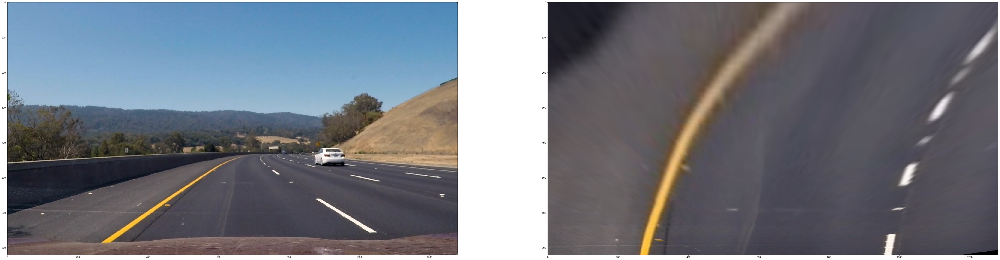

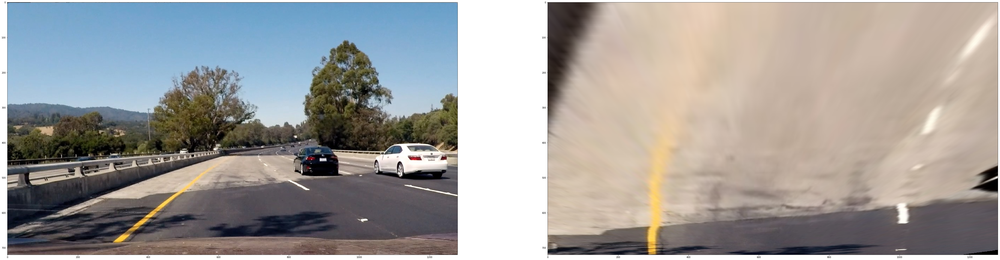

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [28]:


M, img_size = set_up_perspective_transform()
    
for fname in test_images:
    img = cv2.imread(fname)
    warped = correct_perspective(img, M, img_size)
    
    
    fig = plt.figure(figsize=(80, 30)) 
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1]) 
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax0.imshow(mp(img))
    
    ax1.imshow(mp(warped))
    plt.show()
#    size_ = (20, 20)
#    plt.figure(figsize=size_)
#    plt.imshow(mp(warped))
#    plt.show()
    #plt.figure(figsize=size_)
    #plt.imshow(dst, cmap='gray')
    #plt.show()
    
    #break

I will now binarize the image to locate the lane lines

In [31]:
def sobel_edges(img, thresh_min = 30, thresh_max = 100):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))   

    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

def s_magnitude(img, s_thresh_min = 120, s_thresh_max = 255):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    return s_binary

def combine(sxbinary, s_binary):
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

def denoise(combined):
    kernel = np.ones((3,3),np.uint8)
    combined_open = cv2.morphologyEx(combined, cv2.MORPH_OPEN, kernel)
    return combined_open

def binarize(img):
    s_mag = s_magnitude(img)
    sobel = sobel_edges(img)
    combined = combine(sobel,s_mag)
    combined_open = denoise(combined)
    return combined_open


In [30]:

for fname in test_images:
    img = cv2.imread(fname)
    
    s_mag = s_magnitude(img)
    sobel = sobel_edges(img)
    combined = combine(sobel,s_mag)
    combined_open = denoise(combined)

    
    fig = plt.figure(figsize=(80, 30)) 
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1]) 
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    #ax2 = plt.subplot(gs[2])
    ax0.imshow(mp(img))
    
    ax1.imshow(combined, cmap='gray')
    #ax2.imshow(), cmap='gray')
    plt.show()
#    size_ = (20, 20)
#    plt.figure(figsize=size_)
#    plt.imshow(mp(warped))
#    plt.show()
    #plt.figure(figsize=size_)
    #plt.imshow(dst, cmap='gray')
    #plt.show()
    
    #break

KeyboardInterrupt: 

Now, it's time to combine these two operations and find the lane lines.

In [34]:

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width=50, window_height=100, margin=100):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids


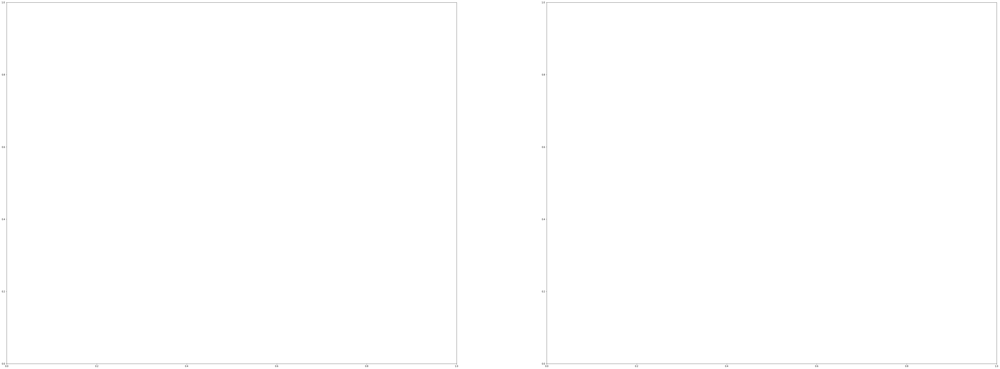

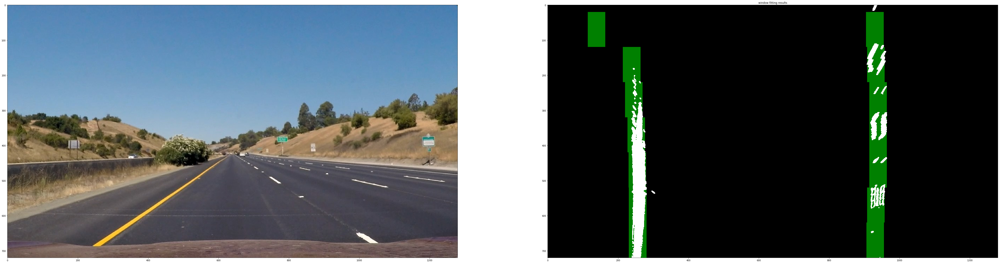

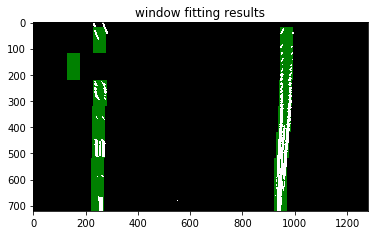

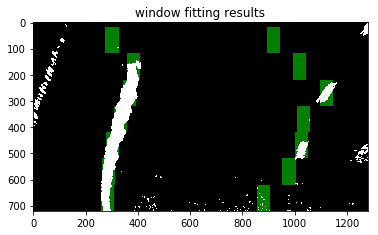

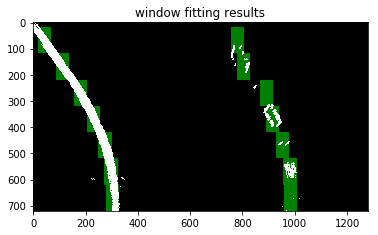

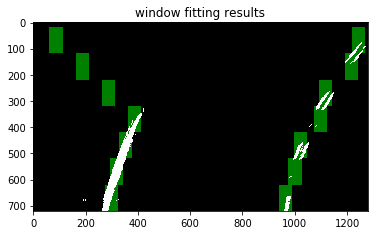

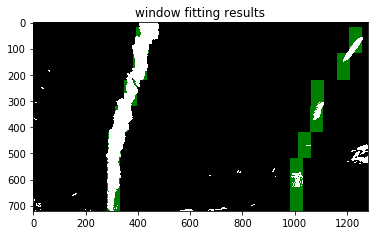

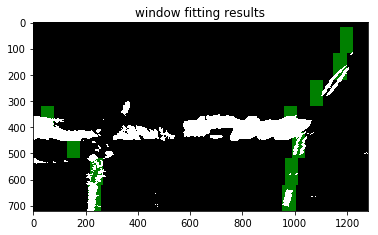

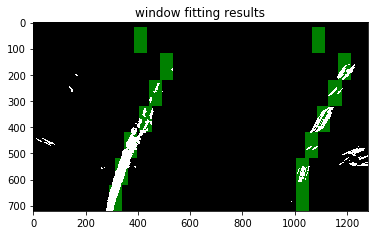

In [40]:
for fname in test_images:
    img = cv2.imread(fname)
    warped = correct_perspective(img, M, img_size)
    binary = binarize(warped)
    
    window_width = 50 
    window_height = 100 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching
    window_centroids = find_window_centroids(binary)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(binary)
        r_points = np.zeros_like(binary)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,binary,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,binary,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((binary, binary, binary))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((binary,binary,binary)),np.uint8)

    # Display the final results
    plt.imshow(output)
    plt.title('window fitting results')
    plt.show()

    
    #fig = plt.figure(figsize=(80, 30)) 
    #gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1]) 
    #ax0 = plt.subplot(gs[0])
    #ax1 = plt.subplot(gs[1])
    #ax2 = plt.subplot(gs[2])
    #ax0.imshow(mp(img))
    
    #ax1.imshow(output, cmap='gray')
    #ax2.imshow(), cmap='gray')
    #plt.show()
#    size_ = (20, 20)
#    plt.figure(figsize=size_)
#    plt.imshow(mp(warped))
#    plt.show()
    #plt.figure(figsize=size_)
    #plt.imshow(dst, cmap='gray')
    #plt.show()
    
    #break

## And so on and so forth...